In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
flow_file= "./data/PEMS04/PEMS04.npz"
csv_file = "./data/PEMS04/distance.csv"
import pandas as pd
data = np.load(flow_file)
df = pd.read_csv(csv_file)
TS = data['data']
flow = TS[:,:,0]
# flow dict key is the sensor number and the value the traffic flow times serie
flow_dict={k:flow[:,k] for k in range(307)}
# list of the first 10 connected sensor, each sensor traffic flow is contained in PeMS 
sensor = set(df['from'][:5])
PeMS = {str(i):flow_dict[i] for i in sensor}
PeMS = pd.DataFrame(PeMS)
# time serie of sensor k
#creation of the datetime index
start_date = "2018-01-01 00:00:00"
end_date = "2018-02-28 23:55:00"
interval = "5min"
index = pd.date_range(start=start_date, end=end_date, freq=interval)
PeMS = PeMS.set_index(index)

In [7]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Dataset and Model Classes

In [8]:
# Define a PyTorch dataset to generate input/target pairs for the LSTM model
class TimeSeriesDataset(Dataset):
    def __init__(self, data, window_size, stride):
        self.data = data
        self.window_size = window_size
        self.stride = stride

    def __len__(self):
        return len(self.data) - self.window_size

    def __getitem__(self, idx):
        inputs = self.data[idx:idx+self.window_size]
        target = self.data[idx+self.window_size]
        return inputs, target

In [9]:
# Define your LSTM model here with 6 LSTM layers and 1 fully connected layer
class LSTMModel(torch.nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super().__init__()
        self.lstm = torch.nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = torch.nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out

# Fed UTILS

In [10]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

import copy
def init_model(n_nodes,main_model):
    return {k:copy.deepcopy(main_model) for k in range(n_nodes)}
    
def send_model(main_model, model_dict, number_of_nodes): #send model to nodes
    with torch.no_grad():
        for i in range(number_of_nodes):
            state_dict= copy.deepcopy(main_model.state_dict())
            model_dict[i].load_state_dict(state_dict)
    return model_dict

def fedavg(main_model, model_dict, number_of_nodes): 
    state_dict = model_dict[0].state_dict()
    for name, param in model_dict[0].named_parameters():
        for i in range(1, number_of_nodes):
            state_dict[name]=  state_dict[name] + model_dict[i].state_dict()[name]
        state_dict[name] = state_dict[name]/number_of_nodes
    new_model = copy.deepcopy(main_model)
    new_model.load_state_dict(state_dict)
    return new_model


In [11]:
#define local dataset for each nodes
def local_dataset(df,nodes=5):
    # Define the sliding window size and stride
    window_size = 7
    stride = 1
    data_dict={}
    for i in range(nodes): 
        # Create datasets and data loaders for training, validation, and test sets
        train_data= pd.DataFrame(df.iloc[:,i][:'2018-01-15 00:00:00'])
        val_data = pd.DataFrame(df.iloc[:,i]['2018-02-15 00:00:00':'2018-02-17 00:00:00'])
        test_data = pd.DataFrame(df.iloc[:,i]['2018-02-17 00:00:00':'2018-02-20 00:00:00'])

        train_dataset = TimeSeriesDataset(train_data.values, window_size, stride)
        val_dataset = TimeSeriesDataset(val_data.values, window_size, stride)
        test_dataset = TimeSeriesDataset(test_data.values, window_size, stride)
    #Modify the data loaders to move the input data and targets to the GPU device
        train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
        train_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in train_loader]

        val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
        val_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in val_loader]

        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
        test_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in test_loader]
        
        data_dict[i]={'train':train_loader,'val':val_loader,'test':test_loader,'test_data':test_data}
    return data_dict

In [12]:
import torch.cuda
def train_model(model_number,local_model,train_loader, val_loader):
  # Train your model and evaluate on the validation set
    num_epochs = 100
    # Define the loss function and optimizer
    criterion = torch.nn.MSELoss()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    local_model.to(device)
    optimizer = torch.optim.Adam(local_model.parameters(), lr=0.001)
    best_val_loss = float('inf')
    train_losses = []
    valid_losses = []
    for epoch in range(num_epochs):
        train_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            train_losses.append(loss.item())
        val_loss = 0.0
        
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            val_loss += loss.item()            
        val_loss /= len(val_loader)
        valid_losses.append(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(local_model.state_dict(), 'best_model_'+str(model_number)+'.pth')
        print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')
    best_model =  copy.deepcopy(local_model)
    best_model.load_state_dict(torch.load('best_model_'+str(model_number)+'.pth'))
    return best_model

In [13]:
def rmspe(y_true, y_pred):
    EPSILON = 1e-10
    return (np.sqrt(np.mean(np.square((y_true - y_pred) / (y_true + EPSILON))))) * 100

# Federated Learning

In [14]:
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)

In [15]:
data_dict = local_dataset(PeMS)

In [16]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

In [17]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)
model_dict = init_model(5,main_model)
for round in range(1,11):
    print('INIT ROUND {} :'.format(round))
    model_dict = send_model(main_model, model_dict, 5)
    for i in range(5):
        print('Training node {} for round {}'.format(i, round))
        model_dict[i] = train_model(i,model_dict[i],data_dict[i]['train'], data_dict[i]['val'])
        if round ==1:
            torch.save(main_model.state_dict(), 'local{}.pth'.format(i))
    print('FedAVG for round {}:'.format(round))
    main_model = fedavg(main_model, model_dict, 5)
    print('Done')
    torch.save(main_model.state_dict(), 'model_round_{}.pth'.format(round))
    


INIT ROUND 1 :
Training node 0 for round 1
Epoch 1/100, Training Loss: 11746711.5929, Validation Loss: 94588.4397
Epoch 2/100, Training Loss: 11381630.9324, Validation Loss: 92195.8260
Epoch 3/100, Training Loss: 11123868.1121, Validation Loss: 90019.7942
Epoch 4/100, Training Loss: 10882833.1152, Validation Loss: 87945.3825
Epoch 5/100, Training Loss: 10651683.5738, Validation Loss: 85942.1937
Epoch 6/100, Training Loss: 10428118.5287, Validation Loss: 83997.1204
Epoch 7/100, Training Loss: 10211027.6047, Validation Loss: 82103.1037
Epoch 8/100, Training Loss: 9999759.9038, Validation Loss: 80255.6460
Epoch 9/100, Training Loss: 9793884.3622, Validation Loss: 78451.6647
Epoch 10/100, Training Loss: 9593089.9035, Validation Loss: 76688.8596
Epoch 11/100, Training Loss: 9397137.0503, Validation Loss: 74965.4103
Epoch 12/100, Training Loss: 9205832.1972, Validation Loss: 73279.8339
Epoch 13/100, Training Loss: 9019013.4388, Validation Loss: 71630.8638
Epoch 14/100, Training Loss: 8836541

# Testing 

## Sensor 5 

FOR SENSOR 5
 
Results for ROUND 1 : 
Test MSE Loss: 13808.8259
RMSPE:84.880 % , MAAPE:43.532 %


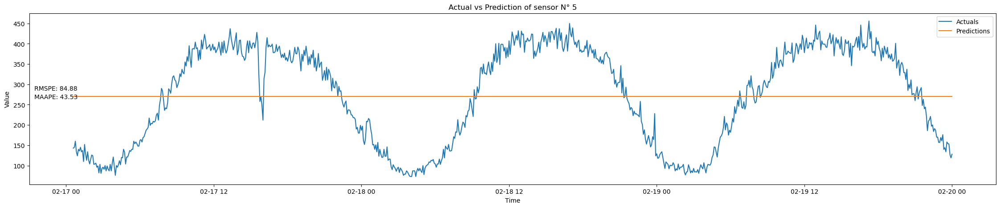

Results for ROUND 2 : 
Test MSE Loss: 3299.3089
RMSPE:23.653 % , MAAPE:19.904 %


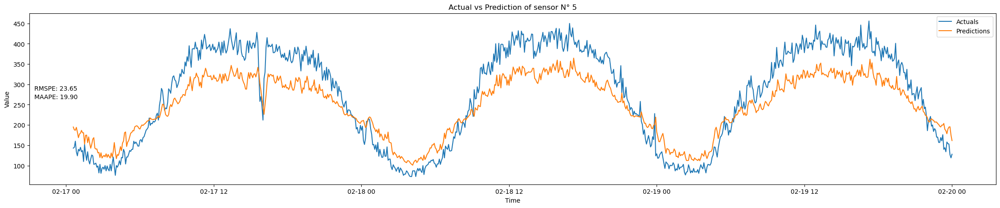

Results for ROUND 3 : 
Test MSE Loss: 801.3968
RMSPE:12.813 % , MAAPE:9.552 %


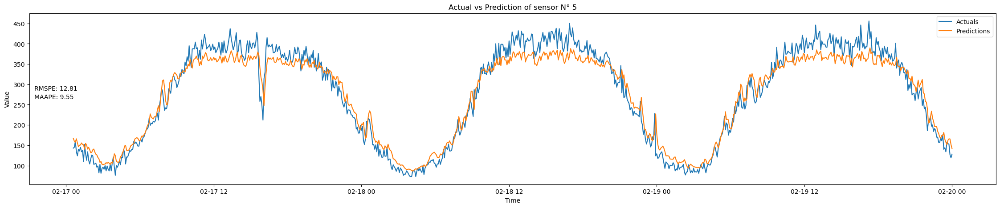

Results for ROUND 4 : 
Test MSE Loss: 425.5615
RMSPE:10.670 % , MAAPE:7.270 %


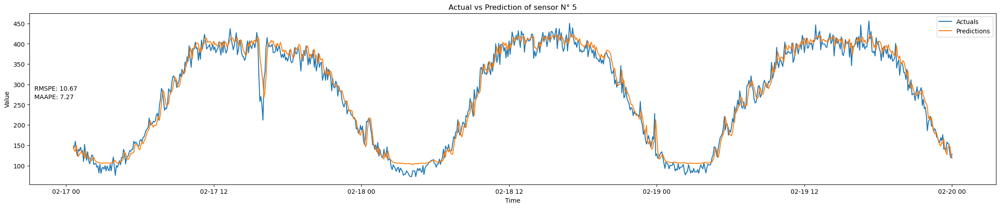

Results for ROUND 5 : 
Test MSE Loss: 580.0212
RMSPE:15.612 % , MAAPE:10.124 %


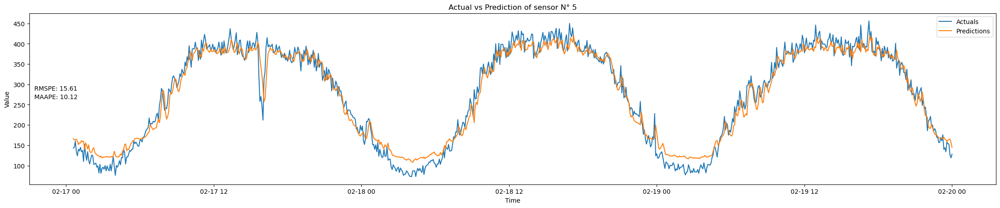

Results for ROUND 6 : 
Test MSE Loss: 559.0982
RMSPE:13.269 % , MAAPE:8.921 %


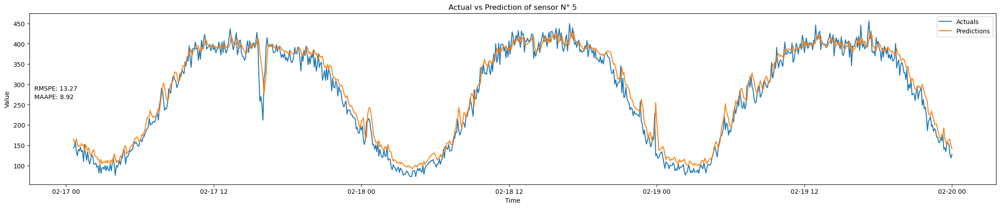

Results for ROUND 7 : 
Test MSE Loss: 2015.0695
RMSPE:16.425 % , MAAPE:13.497 %


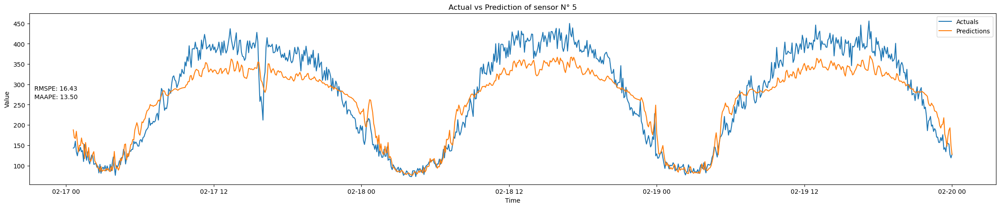

Results for ROUND 8 : 
Test MSE Loss: 2387.9550
RMSPE:20.825 % , MAAPE:15.797 %


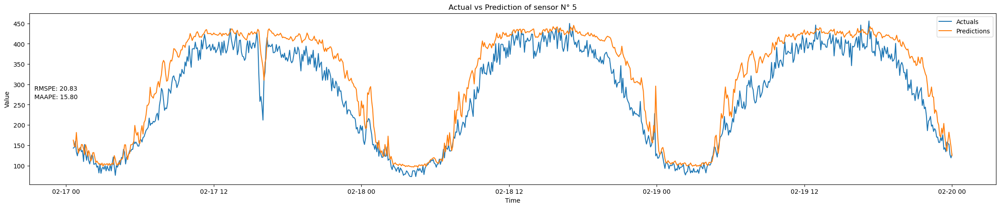

Results for ROUND 9 : 
Test MSE Loss: 836.0338
RMSPE:10.762 % , MAAPE:8.772 %


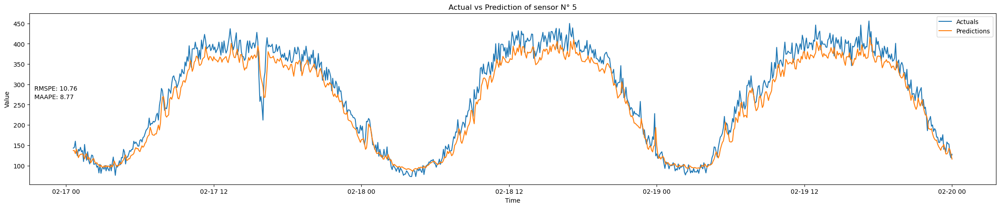

Results for ROUND 10 : 
Test MSE Loss: 516.3935
RMSPE:10.080 % , MAAPE:7.259 %


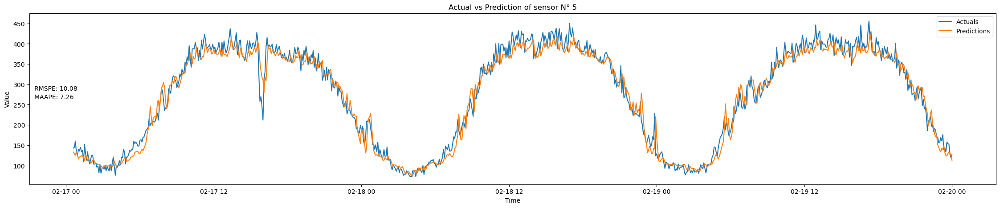

Results for Central Model : 
Test MSE Loss: 431.0983
RMSPE:9.087 % , MAAPE:6.406 %


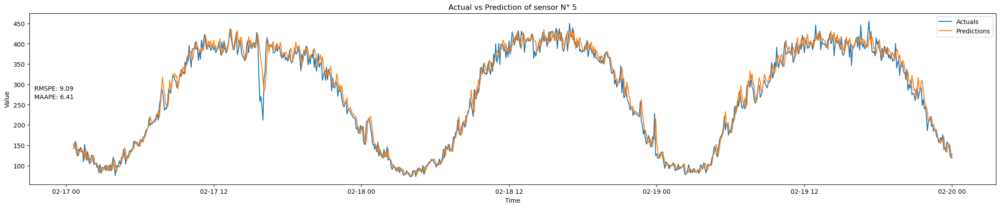

In [23]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=0 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()



## sensor 263

FOR SENSOR 263
 
Results for ROUND 1 : 
Test MSE Loss: 11922.6617
RMSPE:81.819 % , MAAPE:40.006 %


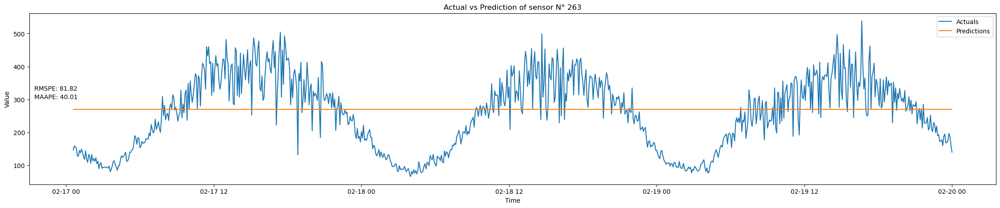

Results for ROUND 2 : 
Test MSE Loss: 3921.0508
RMSPE:25.001 % , MAAPE:20.127 %


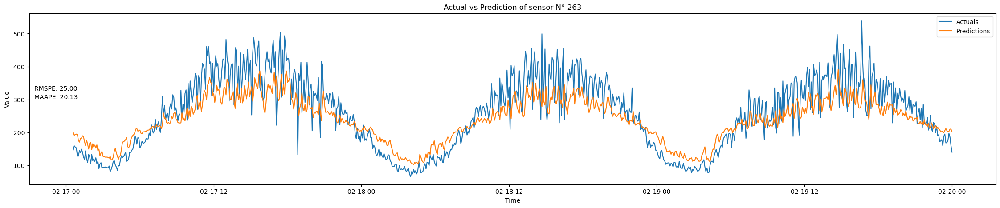

Results for ROUND 3 : 
Test MSE Loss: 2294.6789
RMSPE:19.470 % , MAAPE:14.116 %


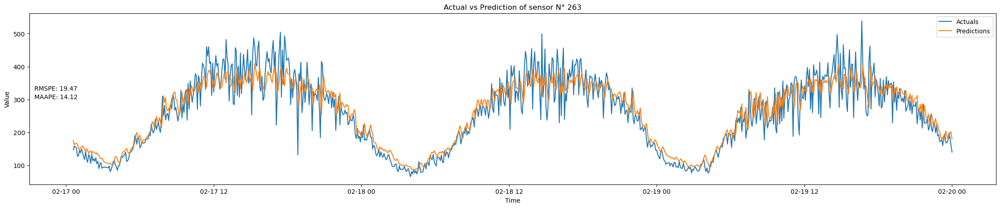

Results for ROUND 4 : 
Test MSE Loss: 2207.0915
RMSPE:18.977 % , MAAPE:12.821 %


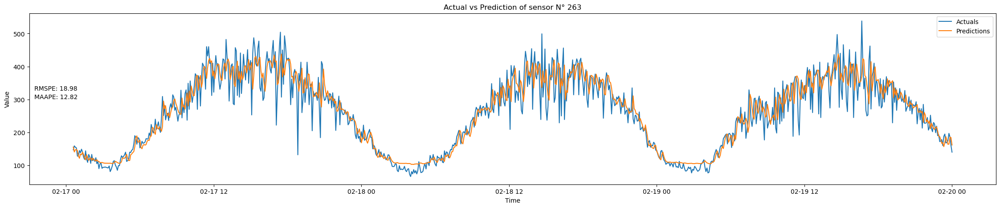

Results for ROUND 5 : 
Test MSE Loss: 2369.8464
RMSPE:21.522 % , MAAPE:15.437 %


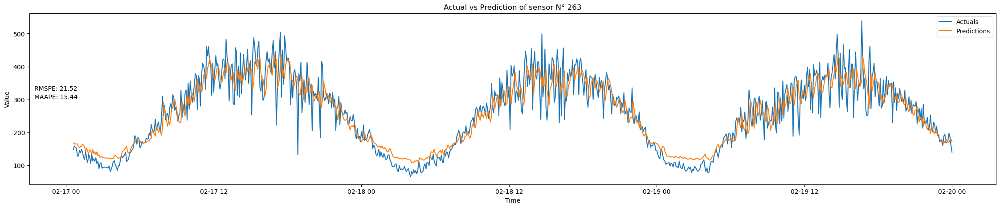

Results for ROUND 6 : 
Test MSE Loss: 2384.7137
RMSPE:21.080 % , MAAPE:14.657 %


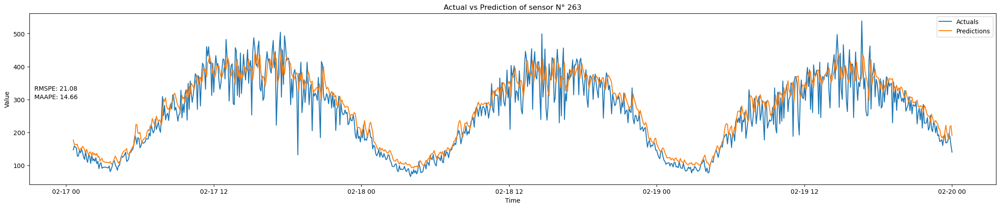

Results for ROUND 7 : 
Test MSE Loss: 2676.2906
RMSPE:19.542 % , MAAPE:15.159 %


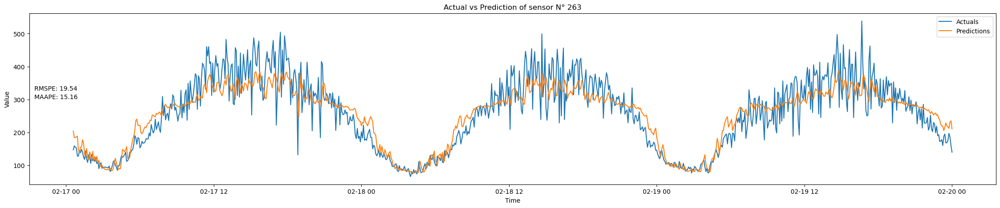

Results for ROUND 8 : 
Test MSE Loss: 4587.8774
RMSPE:28.987 % , MAAPE:20.708 %


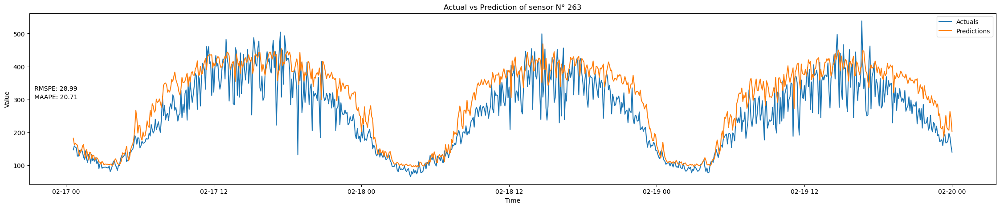

Results for ROUND 9 : 
Test MSE Loss: 2384.1337
RMSPE:17.536 % , MAAPE:13.080 %


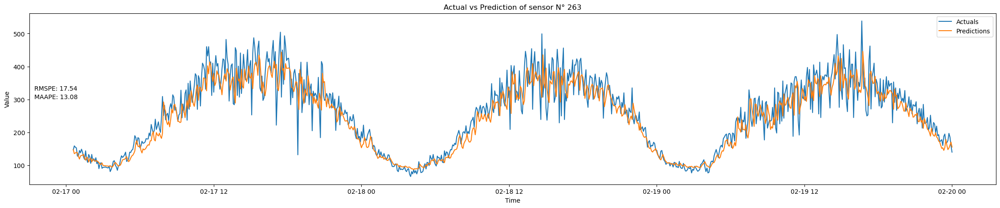

Results for ROUND 10 : 
Test MSE Loss: 2332.6635
RMSPE:18.445 % , MAAPE:13.214 %


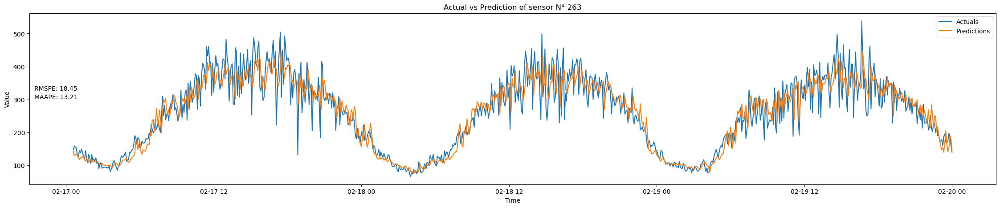

Results for Central Model : 
Test MSE Loss: 1924.5015
RMSPE:16.723 % , MAAPE:11.856 %


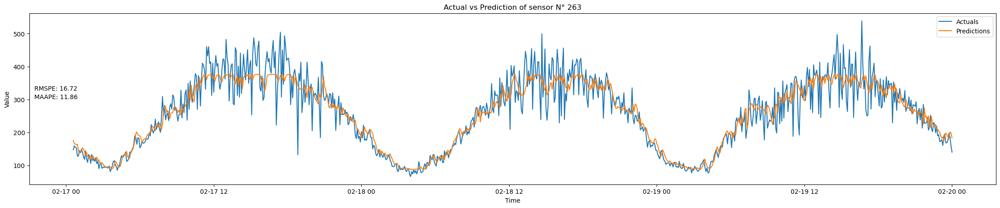

In [24]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=1 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 73

FOR SENSOR 73
 
Results for ROUND 1 : 
Test MSE Loss: 21011.6005
RMSPE:53.613 % , MAAPE:61.275 %


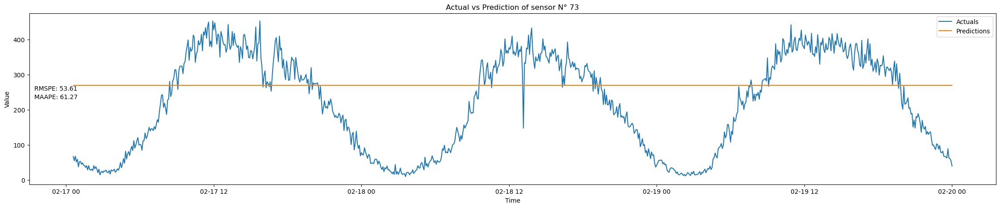

Results for ROUND 2 : 
Test MSE Loss: 2793.2241
RMSPE:33.039 % , MAAPE:33.585 %


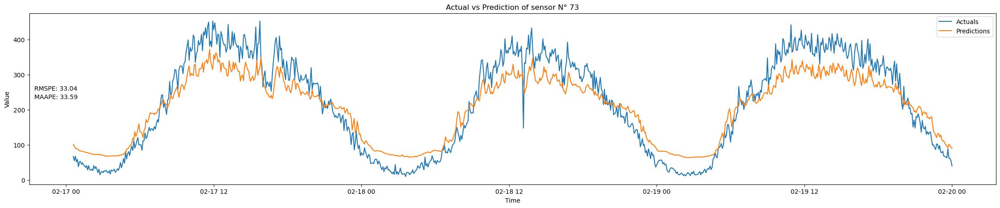

Results for ROUND 3 : 
Test MSE Loss: 954.0359
RMSPE:26.215 % , MAAPE:24.260 %


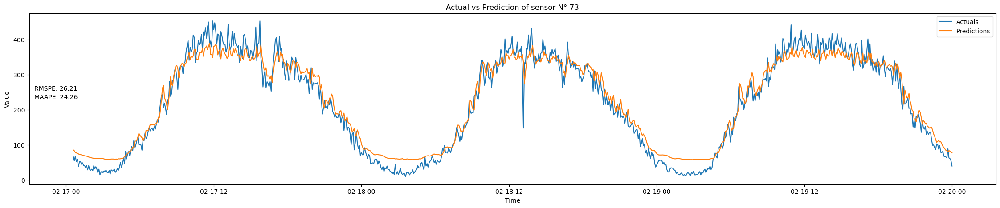

Results for ROUND 4 : 
Test MSE Loss: 994.5089
RMSPE:28.798 % , MAAPE:26.986 %


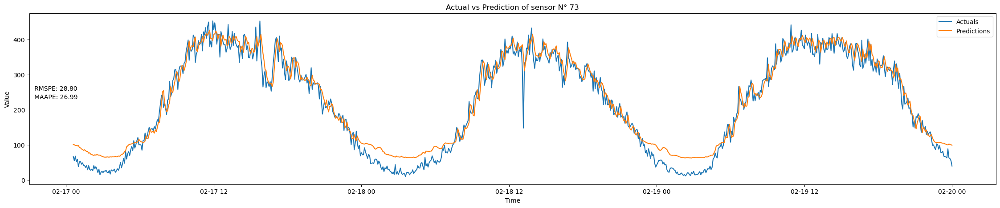

Results for ROUND 5 : 
Test MSE Loss: 1128.9823
RMSPE:29.967 % , MAAPE:28.616 %


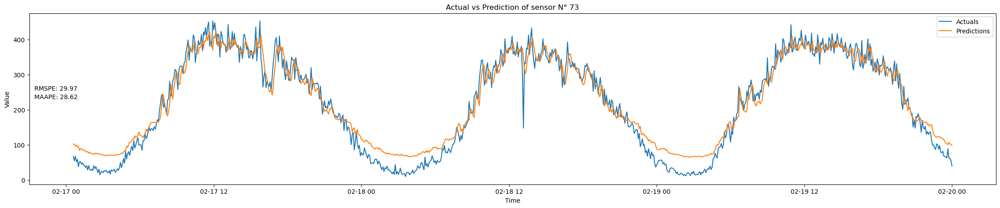

Results for ROUND 6 : 
Test MSE Loss: 958.7749
RMSPE:26.596 % , MAAPE:25.133 %


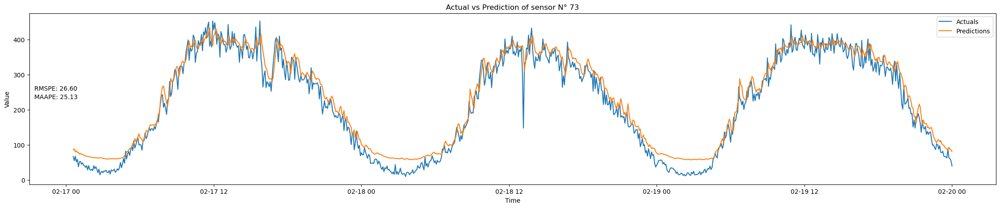

Results for ROUND 7 : 
Test MSE Loss: 1759.4293
RMSPE:28.531 % , MAAPE:27.374 %


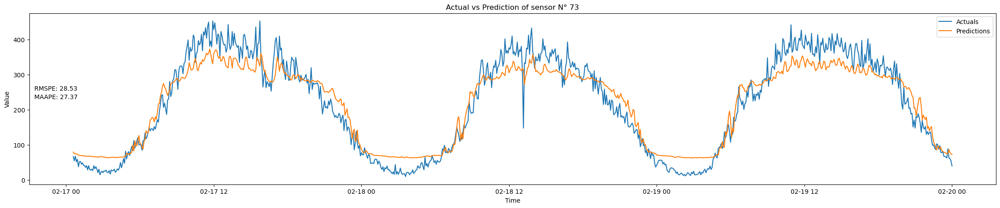

Results for ROUND 8 : 
Test MSE Loss: 2819.6559
RMSPE:29.808 % , MAAPE:32.537 %


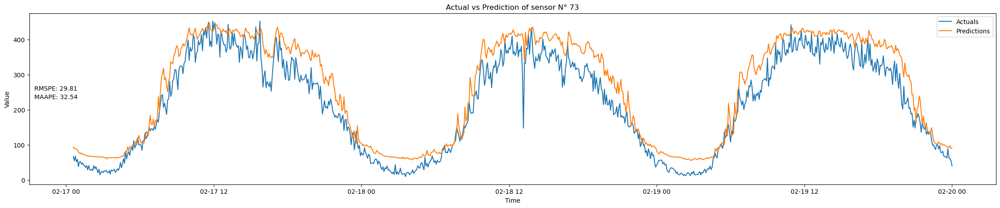

Results for ROUND 9 : 
Test MSE Loss: 1039.4793
RMSPE:24.832 % , MAAPE:22.202 %


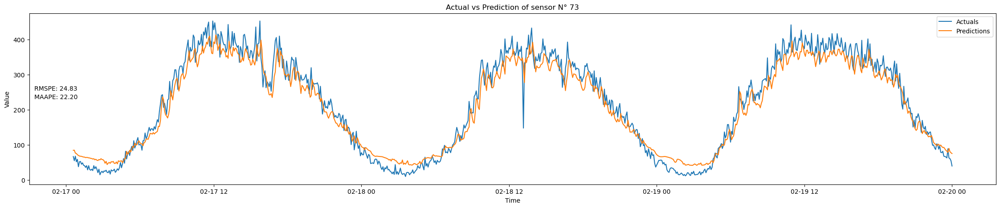

Results for ROUND 10 : 
Test MSE Loss: 745.9441
RMSPE:22.200 % , MAAPE:19.292 %


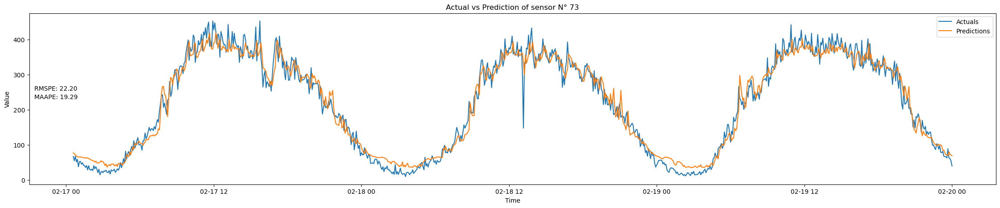

Results for Central Model : 
Test MSE Loss: 581.9516
RMSPE:16.131 % , MAAPE:11.091 %


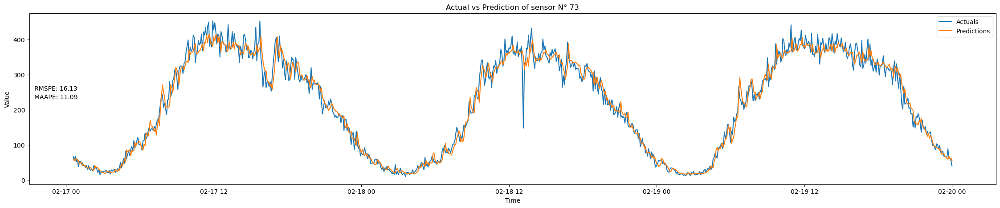

In [25]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=2 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_pred,y_true)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 56

FOR SENSOR 56
 
Results for ROUND 1 : 
Test MSE Loss: 28619.0477
RMSPE:62.839 % , MAAPE:53.925 %


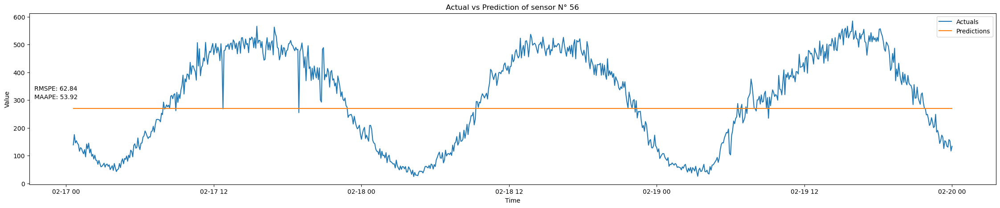

Results for ROUND 2 : 
Test MSE Loss: 4800.4449
RMSPE:25.576 % , MAAPE:23.246 %


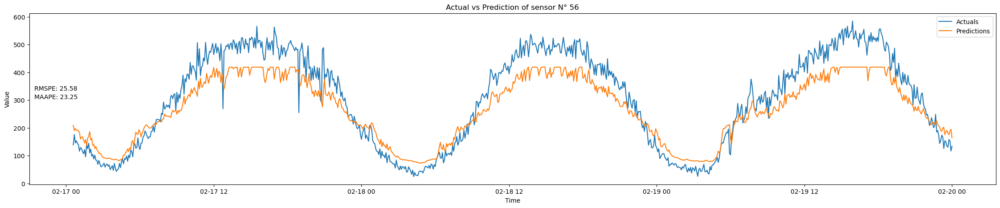

Results for ROUND 3 : 
Test MSE Loss: 3961.5693
RMSPE:20.738 % , MAAPE:17.345 %


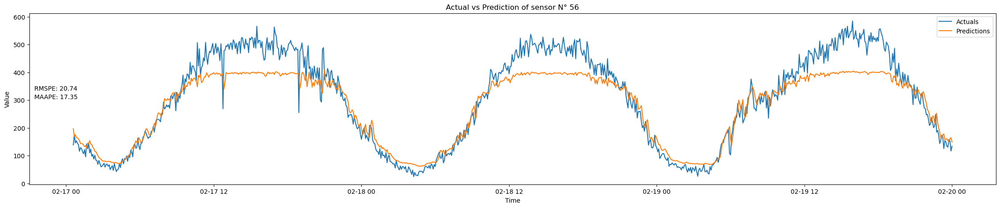

Results for ROUND 4 : 
Test MSE Loss: 1801.4601
RMSPE:19.244 % , MAAPE:16.602 %


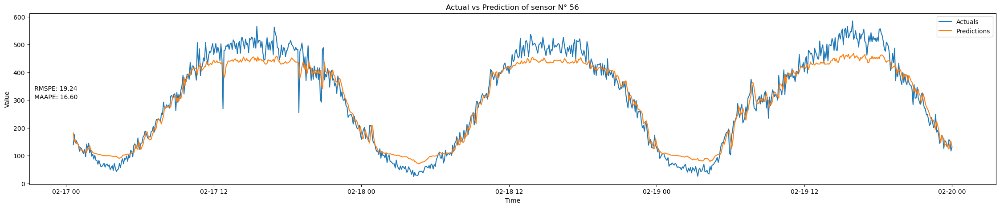

Results for ROUND 5 : 
Test MSE Loss: 1538.5301
RMSPE:19.508 % , MAAPE:17.025 %


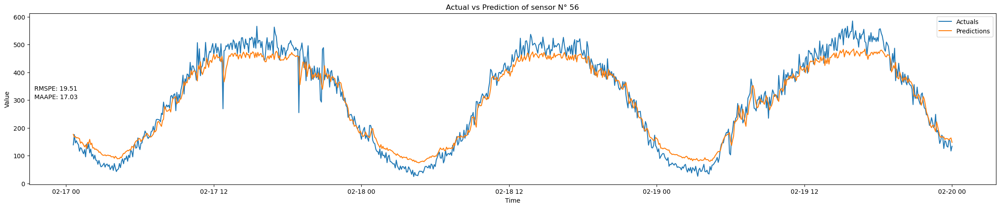

Results for ROUND 6 : 
Test MSE Loss: 1273.7484
RMSPE:16.202 % , MAAPE:14.152 %


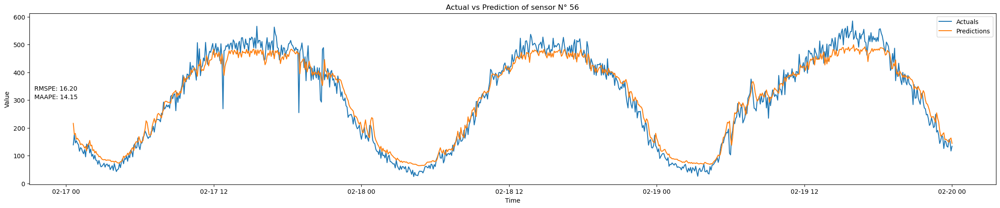

Results for ROUND 7 : 
Test MSE Loss: 3571.5165
RMSPE:20.269 % , MAAPE:17.654 %


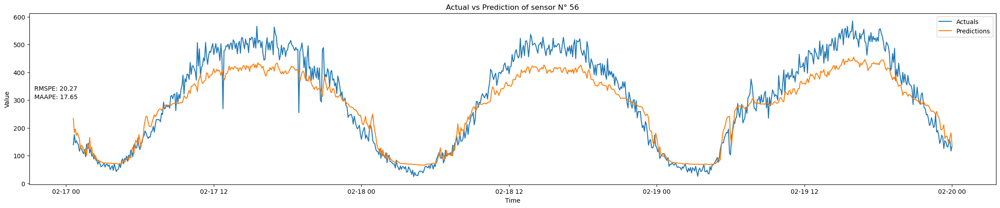

Results for ROUND 8 : 
Test MSE Loss: 2421.8481
RMSPE:19.400 % , MAAPE:18.818 %


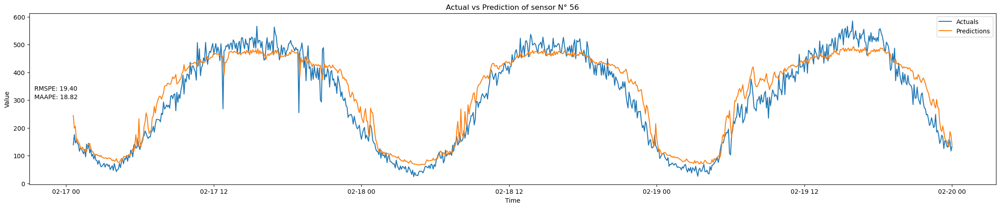

Results for ROUND 9 : 
Test MSE Loss: 1672.3409
RMSPE:16.430 % , MAAPE:12.863 %


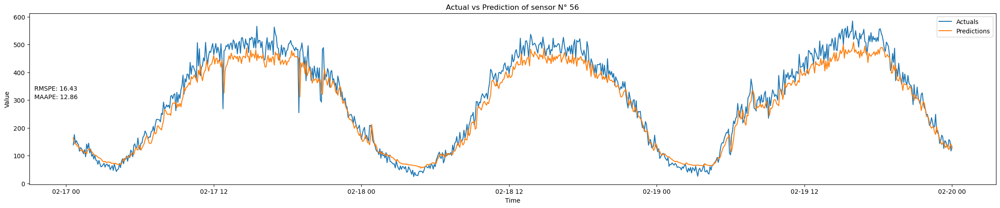

Results for ROUND 10 : 
Test MSE Loss: 1341.8664
RMSPE:14.998 % , MAAPE:11.420 %


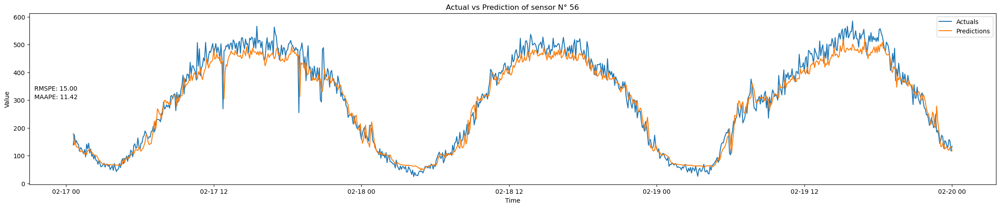

Results for Central Model : 
Test MSE Loss: 10939.8506
RMSPE:36.040 % , MAAPE:21.801 %


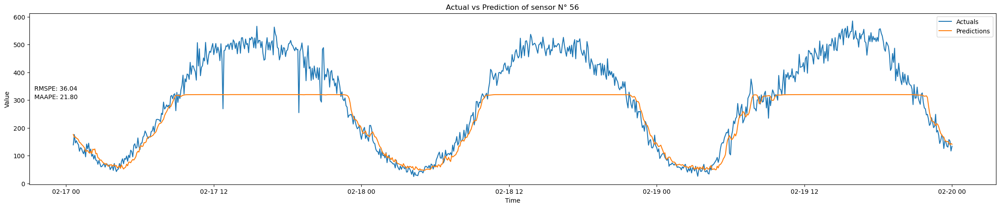

In [26]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=3 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_pred,y_true)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 154

FOR SENSOR 154
 
Results for ROUND 1 : 
Test MSE Loss: 8650.1274
RMSPE:67.190 % , MAAPE:35.669 %


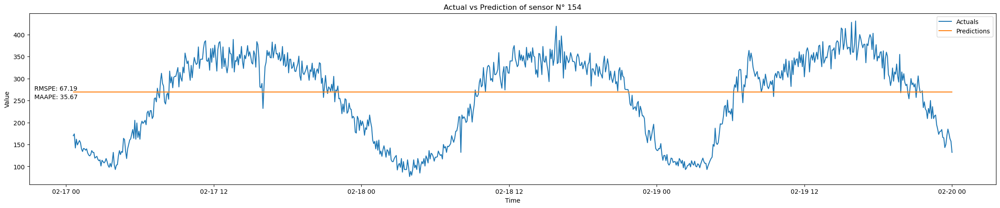

Results for ROUND 2 : 
Test MSE Loss: 2600.7131
RMSPE:22.509 % , MAAPE:18.551 %


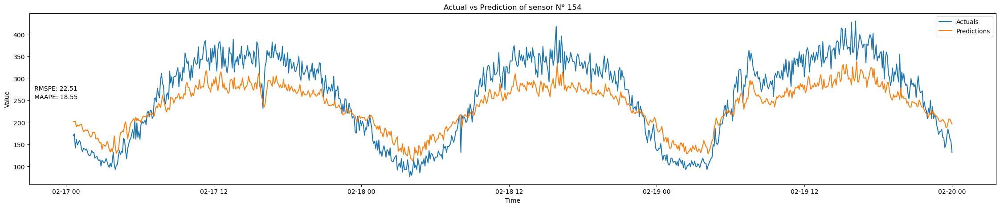

Results for ROUND 3 : 
Test MSE Loss: 584.8627
RMSPE:12.465 % , MAAPE:9.087 %


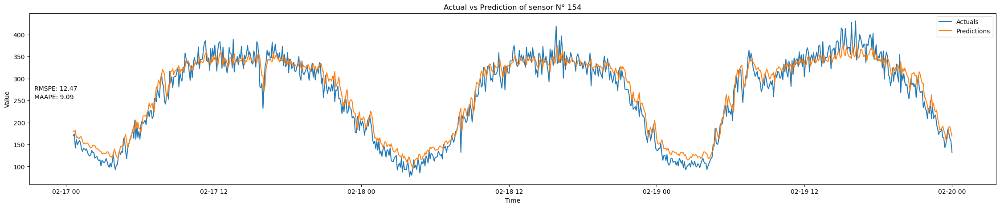

Results for ROUND 4 : 
Test MSE Loss: 483.7368
RMSPE:9.194 % , MAAPE:6.957 %


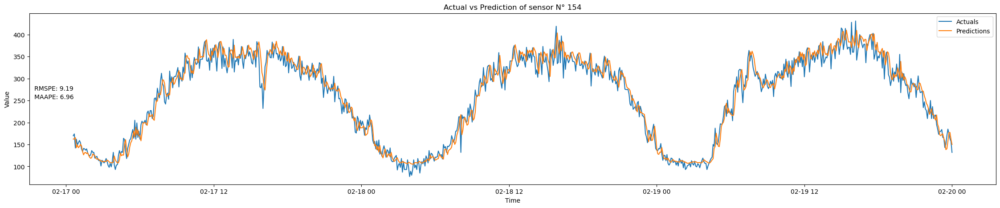

Results for ROUND 5 : 
Test MSE Loss: 603.8683
RMSPE:12.853 % , MAAPE:9.299 %


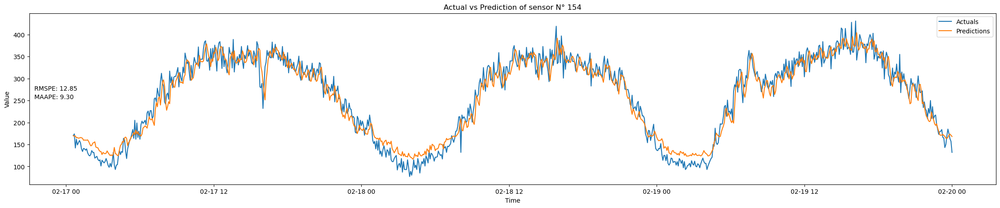

Results for ROUND 6 : 
Test MSE Loss: 678.4713
RMSPE:12.834 % , MAAPE:9.546 %


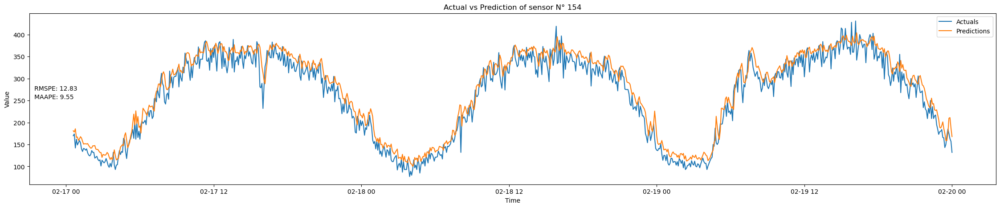

Results for ROUND 7 : 
Test MSE Loss: 1394.7276
RMSPE:15.672 % , MAAPE:12.118 %


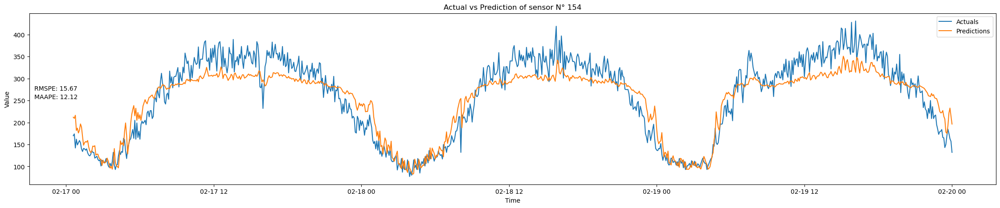

Results for ROUND 8 : 
Test MSE Loss: 3405.6460
RMSPE:23.149 % , MAAPE:18.923 %


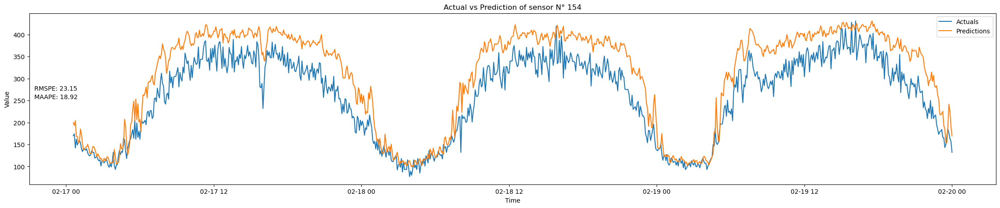

Results for ROUND 9 : 
Test MSE Loss: 896.3909
RMSPE:11.008 % , MAAPE:8.964 %


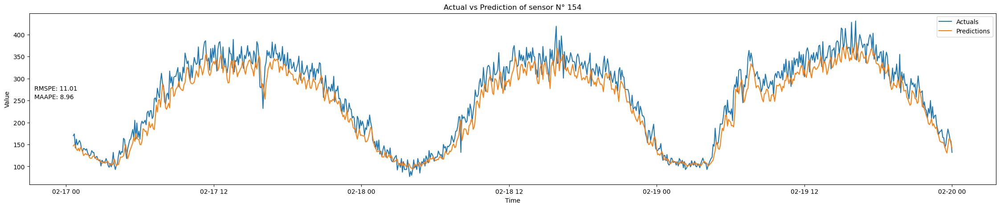

Results for ROUND 10 : 
Test MSE Loss: 542.1861
RMSPE:10.229 % , MAAPE:7.594 %


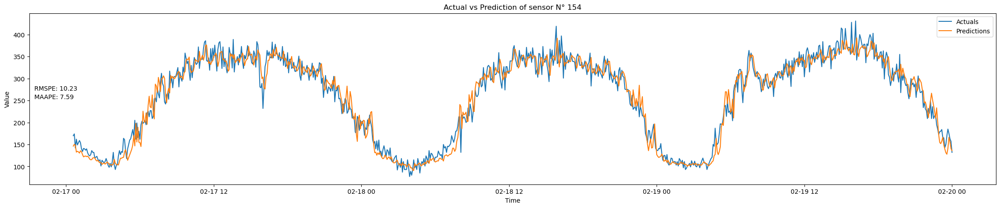

Results for Central Model : 
Test MSE Loss: 10831.8367
RMSPE:82.492 % , MAAPE:36.437 %


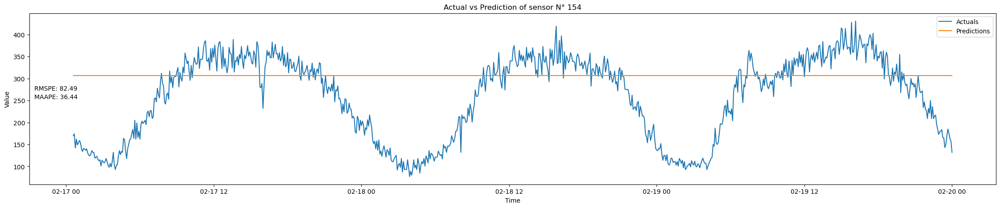

In [27]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=4 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()
